In [1]:
# Qiskit packages
import qiskit, qiskit_aer#, qiskit_ibm_runtime, qiskit_ibm_catalog, qiskit_serverless

from python_files import Query as qry, RS_prep as rsp, General as grl, Stabilizer_and_Graphs as sg

# Other packages
import numpy as np 
import math
import time
import matplotlib.pyplot as plt

In [2]:
# Qiskit functions
from qiskit import QuantumRegister, ClassicalRegister, QuantumCircuit, transpile
from qiskit.quantum_info import Statevector, Clifford, Pauli, PauliList
from qiskit.circuit import Instruction
from qiskit.circuit.classical import expr
from qiskit_aer import AerSimulator
from qiskit.transpiler.passes import RemoveBarriers
from qiskit.transpiler import CouplingMap

# Other funtions
from typing import Optional
from __future__ import annotations
from IPython.display import Math
from numpy.random import default_rng
from collections import deque, Counter

#### Test initialize_adresses and $U_{QRAM}$

[0 1 1 1 1 1 0 1]


<IPython.core.display.Math object>

<IPython.core.display.Math object>

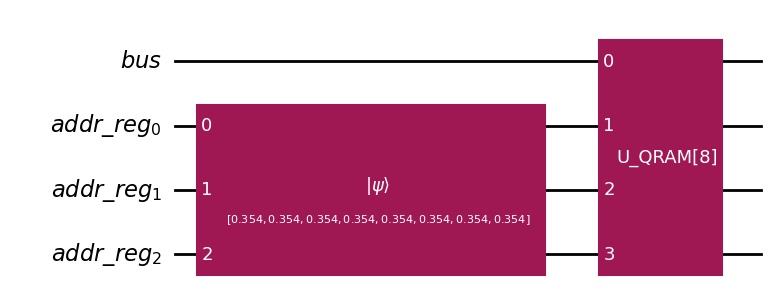

In [3]:
n = 3

# Initialize
mem_bits = qry.make_mem_bits(n)
print(mem_bits)
vec = np.zeros([2**n])
vec[:] = 1
qc = qry.initialize_adresses(n, method="Supply vector", vec=vec)
display(Math((Statevector(qc).draw('latex_source')))) 

# Apply U_QRAM
qry.apply_U_QRAM(qc, qc.qubits, mem_bits)
display(Math((Statevector(qc).draw('latex_source')))) 

qc.draw('mpl')

#### Test $U_{NOHE}$

In [4]:
# initialize
n = 2
input_reg = QuantumRegister(n+1, 'input register')
qc = QuantumCircuit(input_reg)

# make address state
qc.x(input_reg[1])
qc.h(input_reg[-1])
sv_in = Statevector(qc)

rsp.apply_U_NOHE(qc, input_reg[:])

sv_out = Statevector(qc)
display(Math(sv_in.draw('latex_source')))
display(Math(sv_out.draw('latex_source')))
# display(qc.draw('mpl', scale=0.7))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

#### Test $\Phi^{(1)}$ prep

In [5]:
n=3
qc = rsp.make_Phi1(n)
print(qc.draw())

I  = qc.qregs[0][:]
D = [q for reg in qc.qregs[1:] for q in reg]
qc = grl.repackage_into_registers(qc, layout=[("I", I),
                                              ("D", D)])

print(qc.draw())

          ┌───┐                                                              »
     I_0: ┤ H ├─■────────────────────────────────────────────────────────────»
          ├───┤ │                                                            »
     I_1: ┤ H ├─┼──■─────────────────────────────────────────────────────────»
          ├───┤ │  │                                                         »
     I_2: ┤ H ├─┼──┼──■──────────────────────────────────────────────────────»
          ├───┤ │  │  │                                                      »
D_NOHE_0: ┤ H ├─■──┼──┼──────■─────────■─────────■───────────────────────────»
          ├───┤    │  │      │  ┌───┐  │         │                           »
D_NOHE_1: ┤ H ├────■──┼──────■──┤ X ├──┼─────────┼────■───────────────────■──»
          ├───┤       │    ┌─┴─┐└─┬─┘  │         │    │                   │  »
D_NOHE_2: ┤ H ├───────■──X─┤ X ├──■────┼─────────┼────┼────■──────────────┼──»
          ├───┤          │ └───┘       │  ┌───┐  │  

#### Test BMs

In [9]:
n = 1
shots = 10

q1 = QuantumRegister(n, 'q1'); q2 = QuantumRegister(n, 'q2')
c1 = ClassicalRegister(n, 'c1'); c2 = ClassicalRegister(n, 'c2')
qc = QuantumCircuit(q1, q2, c1, c2)

# prepare some state:
qc.x(q1[0])
# qc.x(q2[1])
display(Math((Statevector(qc).draw('latex_source'))))
grl.apply_make_BPs(qc, q1[:] + q2[:])
display(Math((Statevector(qc).draw('latex_source'))))

grl.apply_BMs(qc, q1[:] + q2[:], c1[:] + c2[:])
qc.save_statevector(label="post_meas", pershot=True)

print(qc)

# 3) Simulate and return results
sim = AerSimulator()
tqc = transpile(qc, sim)
res = sim.run(tqc, shots=shots, memory=True).result()

mem, cnts = res.get_memory(tqc), res.get_counts(tqc)

posts = [Statevector(v) for v in res.data(0)['post_meas']]
for sv in posts:
    display(Math((sv.draw('latex_source'))))
    
print("memory:", mem)
# print("counts:", cnts)

<IPython.core.display.Math object>

<IPython.core.display.Math object>

      ┌───┐┌───┐      ┌───┐┌─┐    post_meas 
  q1: ┤ X ├┤ H ├─■──■─┤ H ├┤M├────────░─────
      ├───┤└───┘ │  │ ├───┤└╥┘┌─┐     ░     
  q2: ┤ H ├──────■──■─┤ H ├─╫─┤M├─────░─────
      └───┘           └───┘ ║ └╥┘     ░     
c1: 1/══════════════════════╩══╬════════════
                            0  ║            
c2: 1/═════════════════════════╩════════════
                               0            


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

memory: ['0 1', '0 1', '0 1', '0 1', '0 1', '0 1', '0 1', '0 1', '0 1', '0 1']


#### Test GT

In [10]:
# Run GT protocol
n=2

# 1) Prepare registers
R, I, D = QuantumRegister(n, "R"), QuantumRegister(n, "I"), QuantumRegister(n, "D")
R_clr, I_clr = ClassicalRegister(n, "R_clr"), ClassicalRegister(n, "I_clr")
qc = QuantumCircuit(R, I, D, R_clr, I_clr)

# 2) GT protocol

# Make some input state on R
qc.h(R[0]) 
qc.save_statevector(label="pre_meas", pershot=True) # Save final statevector
# Apply BPs between I and D
grl.apply_make_BPs(qc, I[:]+D[:])
# Apply some operation on D, in this case CNOT
qc.cx(D[0], D[1]) 
# Apply BMs between R and I
grl.apply_BMs(qc, R[:] + I[:], R_clr[:] + I_clr[:])

qc.save_statevector(label="post_meas", pershot=True) # Save final statevector

# 3) Simulate and return results
sim = AerSimulator()
tqc = transpile(qc, sim)
res = sim.run(tqc, shots=1, memory=True).result()

mem, cnts = res.get_memory(tqc), res.get_counts(tqc)

b = mem[0][:n]        # little endian ordering
a = mem[0][(n+1):]    # little endian ordering
print(f"b = {b}, a = {a}")

sv = Statevector(res.data(0)["pre_meas"][0])
display(Math((sv.draw('latex_source'))))
sv = Statevector(res.data(0)["post_meas"][0])
display(Math((sv.draw('latex_source'))))

print(qc.draw())

b = 10, a = 10


<IPython.core.display.Math object>

<IPython.core.display.Math object>

         ┌───┐ pre_meas            ┌───┐     ┌─┐          post_meas 
    R_0: ┤ H ├────░──────────────■─┤ H ├─────┤M├──────────────░─────
         └───┘    ░              │ └───┘┌───┐└╥┘┌─┐           ░     
    R_1: ─────────░──────────────┼───■──┤ H ├─╫─┤M├───────────░─────
                  ░     ┌───┐    │   │  ├───┤ ║ └╥┘┌─┐        ░     
    I_0: ─────────░─────┤ H ├─■──■───┼──┤ H ├─╫──╫─┤M├────────░─────
                  ░     ├───┤ │      │  ├───┤ ║  ║ └╥┘┌─┐     ░     
    I_1: ─────────░─────┤ H ├─┼──■───■──┤ H ├─╫──╫──╫─┤M├─────░─────
                  ░     ├───┤ │  │      └───┘ ║  ║  ║ └╥┘     ░     
    D_0: ─────────░─────┤ H ├─■──┼───■────────╫──╫──╫──╫──────░─────
                  ░     ├───┤    │ ┌─┴─┐      ║  ║  ║  ║      ░     
    D_1: ─────────░─────┤ H ├────■─┤ X ├──────╫──╫──╫──╫──────░─────
                  ░     └───┘      └───┘      ║  ║  ║  ║      ░     
R_clr: 2/═════════════════════════════════════╩══╩══╬══╬════════════
                                  

In [11]:
# Validate outcome
test_qc = QuantumCircuit(n)

# Prepare input state
test_qc.h(test_qc.qubits[0])
print("Input state:")
display(Math((Statevector(test_qc).draw('latex_source'))))

# Apply P_m
for i, bit in enumerate(a):
    if bit == "1":
        test_qc.z(test_qc.qubits[-(i+1)])

for i, bit in enumerate(b):
    if bit == "1":
        test_qc.x(test_qc.qubits[-(i+1)])

# Apply U (CNOT in this case)
test_qc.cx(test_qc.qubits[0], test_qc.qubits[1])
print("Output state:")
display(Math((Statevector(test_qc).draw('latex_source'))))

print(test_qc.draw())

Input state:


<IPython.core.display.Math object>

Output state:


<IPython.core.display.Math object>

     ┌───┐          
q_0: ┤ H ├───────■──
     ├───┤┌───┐┌─┴─┐
q_1: ┤ Z ├┤ X ├┤ X ├
     └───┘└───┘└───┘


In [12]:
# Test GT with U_NOHE (so Phi1)
n = 2
N = 2**n

# prepare address
addr = 0
vec = np.zeros([N])
vec[addr] = 1
qc_add = qry.initialize_adresses(n, register_name="R", method="Supply vector", vec=vec)

# prepare phi 1
qc_rs = rsp.make_Phi1(n)
qc_rs = grl.repackage_into_registers(qc_rs, layout=[("I", qc_rs.qubits[:n]),
                                                    ("D_NOHE", qc_rs.qubits[n:n+N-1]),
                                                    ("L", qc_rs.qubits[n+N-1:])])

# tensor addr and phi 1 and get and add necessary qregs and cregs
qc = qc_rs.tensor(qc_add)
R, I, D_NOHE, L= grl.get_qreg(qc, "R"), grl.get_qreg(qc, "I"), grl.get_qreg(qc, "D_NOHE"), grl.get_qreg(qc, "L")
R_clr = ClassicalRegister(n, "R_clr")
I_clr = ClassicalRegister(n, "I_clr")
D_NOHE_clr = ClassicalRegister(N-1, "D_clr")
L_clr = ClassicalRegister(N, "L_clr")
qc.add_register(R_clr, I_clr, D_NOHE_clr, L_clr)

# apply BMs
grl.apply_BMs(qc, R[:] + I[:n], R_clr[:] + I_clr[:n])

# rotate + qubit in OHE state to -1 in Z-basis
for b in range(N):
    with qc.if_test((I_clr, b)):
        p = addr ^ b
        qc.z(L[p])
        qc.h(L[p])

# measure NOHE and OHE
qc.measure(D_NOHE[:] + L[:], D_NOHE_clr[:] + L_clr[:])

# simulate
sim = AerSimulator(
    method="matrix_product_state",
    # matrix_product_state_max_bond_dimension=1024,            # cap growth
    # matrix_product_state_truncation_threshold=1e-10          # (optional) internal parallelism
)
tqc = transpile(qc, backend=sim, optimization_level=0)
res = sim.run(tqc, shots=10, memory=True).result()
print("Success:", res.success)
print("Overall status:", res.to_dict().get("status", ""))
mem = res.get_memory()
for m in mem:
    print(m)

grl.print_qubit_table(qc)

Success: True
Overall status: COMPLETED
0001 000 00 01
0100 010 10 10
0001 000 00 11
1000 101 11 11
1000 101 11 00
0001 000 00 01
1000 101 11 10
1000 101 11 01
0001 000 00 01
0001 000 00 00
qubit                                    global  register  reg_idx
------------------------------------------------------------------
<Qubit register=(2, "R"), index=0>            0  R               0
<Qubit register=(2, "R"), index=1>            1  R               1
<Qubit register=(2, "I"), index=0>            2  I               0
<Qubit register=(2, "I"), index=1>            3  I               1
<Qubit register=(3, "D_NOHE"), index=0>       4  D_NOHE          0
<Qubit register=(3, "D_NOHE"), index=1>       5  D_NOHE          1
<Qubit register=(3, "D_NOHE"), index=2>       6  D_NOHE          2
<Qubit register=(4, "L"), index=0>            7  L               0
<Qubit register=(4, "L"), index=1>            8  L               1
<Qubit register=(4, "L"), index=2>            9  L               2
<Qubit

#### Test $\Phi^{(2)}$ prep (No compact linearized resource state!)

qubit                                    global  register  reg_idx
------------------------------------------------------------------
<Qubit register=(7, "Dprime"), index=0>       0  Dprime          0
<Qubit register=(7, "Dprime"), index=1>       1  Dprime          1
<Qubit register=(7, "Dprime"), index=2>       2  Dprime          2
<Qubit register=(7, "Dprime"), index=3>       3  Dprime          3
<Qubit register=(7, "Dprime"), index=4>       4  Dprime          4
<Qubit register=(7, "Dprime"), index=5>       5  Dprime          5
<Qubit register=(7, "Dprime"), index=6>       6  Dprime          6
<Qubit register=(7, "K2"), index=0>           7  K2              0
<Qubit register=(7, "K2"), index=1>           8  K2              1
<Qubit register=(7, "K2"), index=2>           9  K2              2
<Qubit register=(7, "K2"), index=3>          10  K2              3
<Qubit register=(7, "K2"), index=4>          11  K2              4
<Qubit register=(7, "K2"), index=5>          12  K2           

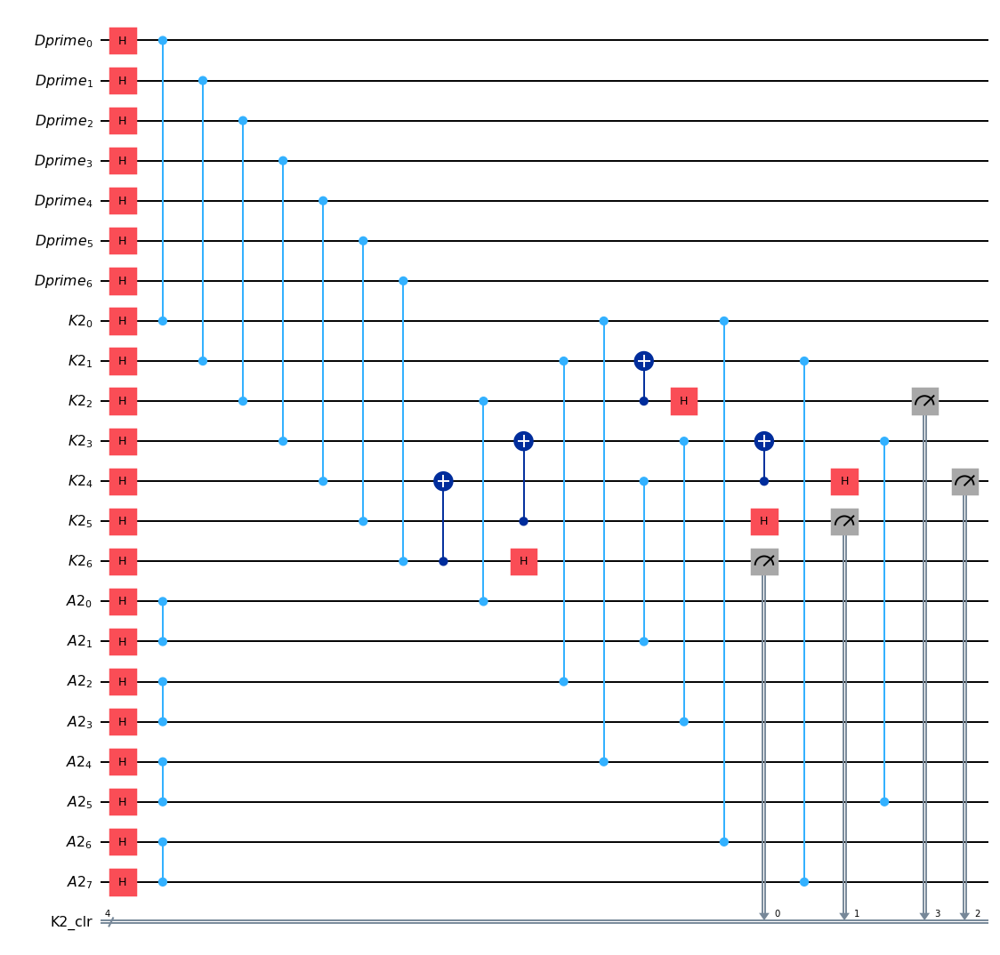

In [ ]:
n = 2  # Note: n' = n+1, because |Dpime| = |K2| = N' = 2*N-1, where N = 2**n, so N' = 2**n'

qc, K2, A2, K2_clr, mapping, info, third_wires = rsp.make_Phi2(n)

sim = AerSimulator()                # default method='automatic' -> statevector is fine
result = sim.run(qc, shots=10).result()

grl.print_qubit_table(qc)
qc.draw("mpl", scale=0.7)

#### Test $(U_{NOHE})^{-1}$

In [17]:
# Making circuit

n = 3
N = 2**n

qc = QuantumCircuit(n)

# Prepare some input state psi. In this case |psi> = (|001> + |101>)/sqrt(2)
qc.x(0)
qc.x(1)
qc.h(n-1)
# qc.z(n-1)

sv = Statevector(qc)
print("input sv:")
display(Math(sv.draw("latex_source")))

rsp.apply_U_NOHE(qc, input_qubits=qc.qubits[:])
qc = grl.repackage_into_registers(qc, layout=[("K2", qc.qubits[:])])

grl.apply_U_NOHE_inversion(qc, input_qubits=qc.qubits[:])

qc.h(n-1)

qc.save_statevector(label="after_h_bus", pershot=True)

# grl.print_qubit_table(qc)
# qc.draw("mpl", scale=0.7)

input sv:


<IPython.core.display.Math object>

In [18]:
# Running circuit

shots=20
# simulate
sim = AerSimulator(method= "statevector")
tqc = transpile(qc, backend=sim, optimization_level=0)
res = sim.run(tqc, shots=shots, memory=True).result()

print("Success:", res.success)
print("Overall status:", res.to_dict().get("status", ""))

# svs_after_C_NOHE = res.data(0)["after_C_NOHE"]
# svs_after_A0_A1_basis_change0 = res.data(0)["after_A0_A1_basis_change0"]
# svs_after_A0_A1_basis_change1 = res.data(0)["after_A0_A1_basis_change1"]
# svs_after_A0_A1_meas = res.data(0)["after_A0_A1_meas"]
# svs_after_Z_corr = res.data(0)["after_Z_corr"]
svs_after_h_bus = res.data(0)["after_h_bus"]

for shot in range(shots):
    print(f"shot: {shot}")
    # print("sv after C_NOHE:")
    # display(Math(svs_after_C_NOHE[shot].draw("latex_source")))
    # print("sv after A0 A1 basis change 0:")
    # display(Math(svs_after_A0_A1_basis_change0[shot].draw("latex_source")))
    # print("sv after A0 A1 basis change 1:")
    # # display(Math(svs_after_A0_A1_basis_change1[shot].draw("latex_source")))
    # print("sv afte A0 A1 meas:")
    # display(Math(svs_after_A0_A1_meas[shot].draw("latex_source")))
    # print("sv after Z corr:")
    # display(Math(svs_after_Z_corr[shot].draw("latex_source")))
    print("sv after h bus:")
    display(Math(svs_after_h_bus[shot].draw("latex_source")))

Success: True
Overall status: COMPLETED
shot: 0
sv after h bus:


<IPython.core.display.Math object>

shot: 1
sv after h bus:


<IPython.core.display.Math object>

shot: 2
sv after h bus:


<IPython.core.display.Math object>

shot: 3
sv after h bus:


<IPython.core.display.Math object>

shot: 4
sv after h bus:


<IPython.core.display.Math object>

shot: 5
sv after h bus:


<IPython.core.display.Math object>

shot: 6
sv after h bus:


<IPython.core.display.Math object>

shot: 7
sv after h bus:


<IPython.core.display.Math object>

shot: 8
sv after h bus:


<IPython.core.display.Math object>

shot: 9
sv after h bus:


<IPython.core.display.Math object>

shot: 10
sv after h bus:


<IPython.core.display.Math object>

shot: 11
sv after h bus:


<IPython.core.display.Math object>

shot: 12
sv after h bus:


<IPython.core.display.Math object>

shot: 13
sv after h bus:


<IPython.core.display.Math object>

shot: 14
sv after h bus:


<IPython.core.display.Math object>

shot: 15
sv after h bus:


<IPython.core.display.Math object>

shot: 16
sv after h bus:


<IPython.core.display.Math object>

shot: 17
sv after h bus:


<IPython.core.display.Math object>

shot: 18
sv after h bus:


<IPython.core.display.Math object>

shot: 19
sv after h bus:


<IPython.core.display.Math object>

#### Compact linearized resource state

---------------------------------------------------------------AARENSON -------------------------------------------------------------------------

In [19]:
n = 1

# Make Phi 2
qc = rsp.make_Phi2(n)
tot_qubits = len(qc.qubits)

# Create tableau, run, and inspect outputs 
tab = sg.Tableau(n=tot_qubits, seed=123)   
meas, final_gens = sg.run_clifford_with_meas_as_tableau(qc, tab)

print("\nMeasurement outcomes (by classical bit index):", meas)

print("\nFinal stabilizer generators (post all measurements):")
sg.pretty_stabs(final_gens)
print(final_gens)

AttributeError: 'tuple' object has no attribute 'qubits'

---------------------------------------------------------------VAN DEN NEST -------------------------------------------------------------------------

In [12]:
n = 2

# Make Phi 2
qc = rsp.make_Phi2(n)
tot_qubits = len(qc.qubits)

# get original stabilizers of |Phi2>
tab_phi2 = sg.Tableau(n=tot_qubits, seed=123)
_, phi2_gens = sg.run_clifford_with_meas_as_tableau(qc, tab_phi2)

# convert to graph form (with the fixed to_graph_form)
theta, R, LC_ops, Sg = sg.to_graph_form(phi2_gens)

# build circuits for |G> and L^†
qc_G_1D = sg.build_1D_CZ_circuit(theta)
qc_Ldag = sg.local_ops_to_circuit_dagger(LC_ops)

# apply |G> then L^†
qc_pipeline = QuantumCircuit(tot_qubits)
qc_pipeline.compose(qc_G_1D, qubits=range(tot_qubits), inplace=True)
qc_pipeline.compose(qc_Ldag, qubits=range(tot_qubits), inplace=True)
print(qc_pipeline)

# stabilizers of pipeline output
tab_out = sg.Tableau(n=tot_qubits, seed=123)
_, gens_pipeline = sg.run_clifford_with_meas_as_tableau(qc_pipeline, tab_out)

missing = []
for stab in phi2_gens:
    if not sg.stabilizer_group_contains(stab, gens_pipeline):
        missing.append(stab)
print("Not contained in output group:", missing)

# also check the other direction to be thorough:
missing2 = []
for stab in gens_pipeline:
    if not sg.stabilizer_group_contains(stab, phi2_gens):
        missing2.append(stab)
print("Not contained in original group:", missing2)

      ┌───┐                                                            
 q_0: ┤ H ├──■─────────────────────────────────────────────────────────
      ├───┤  │                    ┌───┐                                
 q_1: ┤ H ├──┼───■──■───────────■─┤ H ├────────────────────────────────
      ├───┤  │   │  │           │ └───┘                                
 q_2: ┤ H ├──┼───■──┼──■────────┼──────────────────────────────────────
      ├───┤  │      │  │        │      ┌───┐┌───┐                      
 q_3: ┤ H ├──┼───■──┼──┼──■─────┼───■──┤ Z ├┤ H ├──────────────────────
      ├───┤  │   │  │  │  │     │   │  ├───┤└───┘                      
 q_4: ┤ H ├──┼───┼──┼──┼──┼──■──┼───┼──┤ H ├───────────────────────────
      ├───┤  │   │  │  │  │  │  │   │  └───┘              ┌───┐        
 q_5: ┤ H ├──┼───┼──┼──┼──┼──┼──┼───┼────■────■─────────■─┤ H ├────────
      ├───┤  │   │  │  │  │  │  │   │    │    │         │ └───┘        
 q_6: ┤ H ├──┼───■──┼──┼──┼──■──┼───┼────■────┼───■─────┼───────

--------------------------------------------------------------- G to LC-eq linear G -------------------------------------------------------------------------

In [6]:
n = 2

# Make Phi 2
qc = rsp.make_Phi2(n)
tot_qubits = len(qc.qubits)

# original stabilizers of |Phi2>
tab_phi2 = sg.Tableau(n=tot_qubits, seed=123)
_, phi2_gens = sg.run_clifford_with_meas_as_tableau(qc, tab_phi2)

# convert to graph form (with the fixed to_graph_form)
theta, R, LC_ops, Sg = sg.to_graph_form(phi2_gens)

# build must-keep set from *this* circuit
must_keep = sg.build_must_keep(qc, include_A2=True)   # or False to exclude A2
print("Must-keep (expected survivors):", must_keep)

# prune deterministically to exactly must_keep (no extra deletions)
theta_pruned, LC_ops_pruned, survivors_orig = sg.prune_to_must_keep(
    theta, LC_ops, must_keep_original=must_keep, original_labels=list(range(theta.shape[0]))
)
print("Survivors (original/global indices):", survivors_orig)

# choose the component that contains (almost) all survivors
comps = sg.connected_components(theta_pruned)
nodes = max(comps, key=len) if comps else []
print("component size:", len(nodes))
sg.print_component_degrees(theta_pruned, nodes, survivors_orig, label="pre-descent")

theta_path, LC_ops2, order_cur = sg.ida_star_to_path(
    theta_pruned, LC_ops_pruned, nodes, time_limit_sec=180, max_depth=400
)
if theta_path is None:
    print("IDA* could not reach a path within the limits.")
else:
    path_order_globals = [survivors_orig[i] for i in order_cur]
    print("Path found! order (global):", path_order_globals)
    # optional: verify degree pattern on the component
    sg.print_component_degrees(theta_path, nodes, survivors_orig, label="post-IDA*")
    # optional: build circuits
    if HAVE_QISKIT:
        qc_G_1D = sg.build_1D_CZ_circuit(theta_path, order=order_cur)
        qc_Ldag  = sg.local_ops_to_circuit_dagger(LC_ops2)

Must-keep (expected survivors): [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 14, 15, 16, 17, 18, 19, 20, 21]
Survivors (original/global indices): [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 14, 15, 16, 17, 18, 19, 20, 21]
component size: 18

Degrees on pre-descent (size=18):
 current idx -> deg: [(0, 1), (np.int64(1), 3), (np.int64(2), 2), (np.int64(3), 3), (np.int64(4), 1), (np.int64(5), 3), (np.int64(6), 4), (np.int64(7), 3), (np.int64(8), 3), (np.int64(9), 3), (np.int64(10), 3), (np.int64(11), 4), (np.int64(12), 2), (np.int64(13), 3), (np.int64(14), 2), (np.int64(15), 2), (np.int64(16), 2), (np.int64(17), 2)]
 global idx  -> deg: [(0, 1), (1, 3), (2, 2), (3, 3), (4, 1), (5, 3), (6, 4), (7, 3), (8, 3), (10, 3), (14, 3), (15, 4), (16, 2), (17, 3), (18, 2), (19, 2), (20, 2), (21, 2)]
 degree histogram: {1: 2, 2: 6, 3: 8, 4: 2}
 max degree: 4
 #endpoints (deg=1): 2
 #internal  (deg=2): 6
 endpoints (current): [0, np.int64(4)]
 endpoints (global) : [0, 4]
IDA* could not reach a path within the limits.


#### Test $\Phi$ prep: No errors, but how to test???

In [20]:
n = 2

qc = rsp.make_phi_normal(n)

grl.print_qubit_table(qc)
qc.draw("mpl", scale=0.7)

qubit                                    global  register  reg_idx
------------------------------------------------------------------
<Qubit register=(2, "I"), index=0>            0  I               0
<Qubit register=(2, "I"), index=1>            1  I               1
<Qubit register=(3, "D_NOHE"), index=0>       2  D_NOHE          0
<Qubit register=(3, "D_NOHE"), index=1>       3  D_NOHE          1
<Qubit register=(3, "D_NOHE"), index=2>       4  D_NOHE          2
<Qubit register=(4, "L"), index=0>            5  L               0
<Qubit register=(4, "L"), index=1>            6  L               1
<Qubit register=(4, "L"), index=2>            7  L               2
<Qubit register=(4, "L"), index=3>            8  L               3
<Qubit register=(7, "Dprime"), index=0>       9  Dprime          0
<Qubit register=(7, "Dprime"), index=1>      10  Dprime          1
<Qubit register=(7, "Dprime"), index=2>      11  Dprime          2
<Qubit register=(7, "Dprime"), index=3>      12  Dprime       

#### Query step i

In [21]:
# USING MERGED PHI's (v2) - This test only works when you do not entangle L with D'. But, I'm not sure whether it actually tests the merging in that case.
n = 1
N = 2**n

addr = 0
vec = np.zeros([N])
vec[addr] = 1
qc_addr = qry.initialize_adresses(n, register_name="R", method="Supply vector", vec=vec)
qc_RS = rsp.make_phi_normal(n)
qc = qc_RS.tensor(qc_addr)

# qc.save_statevector("after RS prep", pershot=True)

qry.query_step_i(qc, n)

# rotate '+' qubit in OHE state to -1 in Z-basis
L = grl.get_qreg(qc, "L")
I_clr = grl.get_creg(qc, "I_clr")
for b in range(N):
    with qc.if_test((I_clr, b)):
        p = addr ^ b
        qc.z(L[p])
        qc.h(L[p])

L_clr = grl.get_creg(qc, "L_clr")
qc.measure(L, L_clr)

In [22]:
shots=50
# simulate
sim = AerSimulator(method= "statevector")
tqc = transpile(qc, backend=sim, optimization_level=0)
res = sim.run(tqc, shots=shots, memory=True).result()

print("Success:", res.success)
print("Overall status:", res.to_dict().get("status", ""))

mem    = res.get_memory()
counts = res.get_counts()

grl.print_qubit_table(qc)

for m in mem:
    print(m)

Success: True
Overall status: COMPLETED
qubit                                    global  register  reg_idx
------------------------------------------------------------------
<Qubit register=(1, "R"), index=0>            0  R               0
<Qubit register=(1, "I"), index=0>            1  I               0
<Qubit register=(1, "D_NOHE"), index=0>       2  D_NOHE          0
<Qubit register=(2, "L"), index=0>            3  L               0
<Qubit register=(2, "L"), index=1>            4  L               1
<Qubit register=(3, "Dprime"), index=0>       5  Dprime          0
<Qubit register=(3, "Dprime"), index=1>       6  Dprime          1
<Qubit register=(3, "Dprime"), index=2>       7  Dprime          2
<Qubit register=(3, "K2"), index=0>           8  K2              0
<Qubit register=(3, "K2"), index=1>           9  K2              1
<Qubit register=(3, "K2"), index=2>          10  K2              2
<Qubit register=(2, "A2"), index=0>          11  A2              0
<Qubit register=(2, "A

qubit                               global  register  reg_idx
-------------------------------------------------------------
<Qubit register=(3, "Q"), index=0>       0  Q               0
<Qubit register=(3, "Q"), index=1>       1  Q               1
<Qubit register=(3, "Q"), index=2>       2  Q               2

clbit                               global  register  reg_idx
-------------------------------------------------------------
<Clbit register=(3, "C"), index=0>       0  C               0
<Clbit register=(3, "C"), index=1>       1  C               1
<Clbit register=(3, "C"), index=2>       2  C               2

Success: True
Overall status: COMPLETED
111 : 5011
011 : 4989


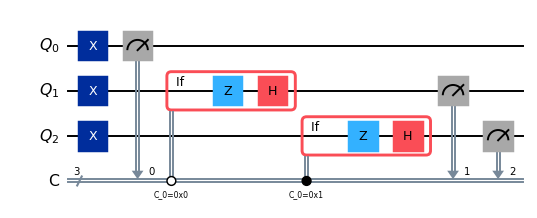

In [23]:
# TESTING L MEASUREMENT METHOD ON SIMPLE CIRCUIT
a = 0
n = 3

qreg = QuantumRegister(n, "Q")
creg = ClassicalRegister(n, "C")
qc = QuantumCircuit(qreg, creg)

qc.x(0); 
qc.x(1); qc.x(2)
qc.measure(qreg[0], creg[0])

for b in range(2):
    with qc.if_test((creg[0], b)):
        p = a ^ b + 1
        qc.z(p)
        qc.h(p)

qc.measure(qreg[1:3], creg[1:3])

grl.print_qubit_table(qc)

# simulate
sim = AerSimulator(
    method="statevector",
    # matrix_product_state_max_bond_dimension=1024,         # cap growth
    # matrix_product_state_truncation_threshold=1e-10          # (optional) internal parallelism
)
tqc = transpile(qc, backend=sim, optimization_level=0)
res = sim.run(tqc, shots=10000, memory=True).result()
print("Success:", res.success)
print("Overall status:", res.to_dict().get("status", ""))
d = res.get_counts()
for key, value in d.items():
    print(key, ":", value)

qc.draw("mpl", scale=0.7)

In [24]:
# TESTING STEP i ON PHI 1 ONLY
n = 1
N = 2**n
shots = 10

# prepare address and phi 1
addr = 0
vec = np.zeros([N])
vec[addr] = 1
qc_addr = qry.initialize_adresses(n, register_name="R", method="Supply vector", vec=vec)
qc_phi1 = rsp.make_Phi1(n)
qc = qc_phi1.tensor(qc_addr)

# measure D_NOHE
D_NOHE = grl.get_qreg(qc, "D_NOHE")
D_NOHE_clr = ClassicalRegister(N-1, "D_NOHE_clr")
qc.add_register(D_NOHE_clr)
qc.measure(D_NOHE[:], D_NOHE_clr[:])

# do step i (i.e. BMs between R and I)
qry.query_step_i(qc, n)

# rotate + qubit in OHE state to -1 in Z-basis
L = grl.get_qreg(qc, "L")
I_clr = grl.get_creg(qc, "I_clr")
for b in range(N):
    with qc.if_test((I_clr, b)):
        p = addr ^ b
        qc.z(L[p])
        qc.h(L[p])

# measure OHE part (L)
L_clr = ClassicalRegister(N, "L_clr")
qc.measure(L[:], L_clr[:])

# simulate
sim = AerSimulator(
    method="matrix_product_state",
    # matrix_product_state_max_bond_dimension=1024,         # cap growth
    # matrix_product_state_truncation_threshold=1e-10          # (optional) internal parallelism
)
tqc = transpile(qc, backend=sim, optimization_level=0)
res = sim.run(tqc, shots=shots, memory=True).result()
print("Success:", res.success)
print("Overall status:", res.to_dict().get("status", ""))
mem = res.get_memory()
for m in mem:
    print(m)

grl.print_qubit_table(qc)

Success: True
Overall status: COMPLETED
10 1 0 1
10 1 0 1
10 1 1 1
10 1 1 1
01 0 1 0
10 1 1 1
10 1 1 1
10 1 0 1
01 0 0 0
01 0 0 0
qubit                                    global  register  reg_idx
------------------------------------------------------------------
<Qubit register=(1, "R"), index=0>            0  R               0
<Qubit register=(1, "I"), index=0>            1  I               0
<Qubit register=(1, "D_NOHE"), index=0>       2  D_NOHE          0
<Qubit register=(2, "L"), index=0>            3  L               0
<Qubit register=(2, "L"), index=1>            4  L               1

clbit                                        global  register    reg_idx
------------------------------------------------------------------------
<Clbit register=(1, "D_NOHE_clr"), index=0>       0  D_NOHE_clr        0
<Clbit register=(1, "R_clr"), index=0>            1  R_clr             0
<Clbit register=(1, "I_clr"), index=0>            2  I_clr             0
<Clbit register=(2, "L_clr"), index

#### Query step ii

mem bits: [1 0]
qubit                                    global  register  reg_idx
------------------------------------------------------------------
<Qubit register=(1, "R"), index=0>            0  R               0
<Qubit register=(1, "I"), index=0>            1  I               0
<Qubit register=(1, "D_NOHE"), index=0>       2  D_NOHE          0
<Qubit register=(2, "L"), index=0>            3  L               0
<Qubit register=(2, "L"), index=1>            4  L               1
<Qubit register=(3, "Dprime"), index=0>       5  Dprime          0
<Qubit register=(3, "Dprime"), index=1>       6  Dprime          1
<Qubit register=(3, "Dprime"), index=2>       7  Dprime          2
<Qubit register=(3, "K2"), index=0>           8  K2              0
<Qubit register=(3, "K2"), index=1>           9  K2              1
<Qubit register=(3, "K2"), index=2>          10  K2              2
<Qubit register=(2, "A2"), index=0>          11  A2              0
<Qubit register=(2, "A2"), index=1>          1

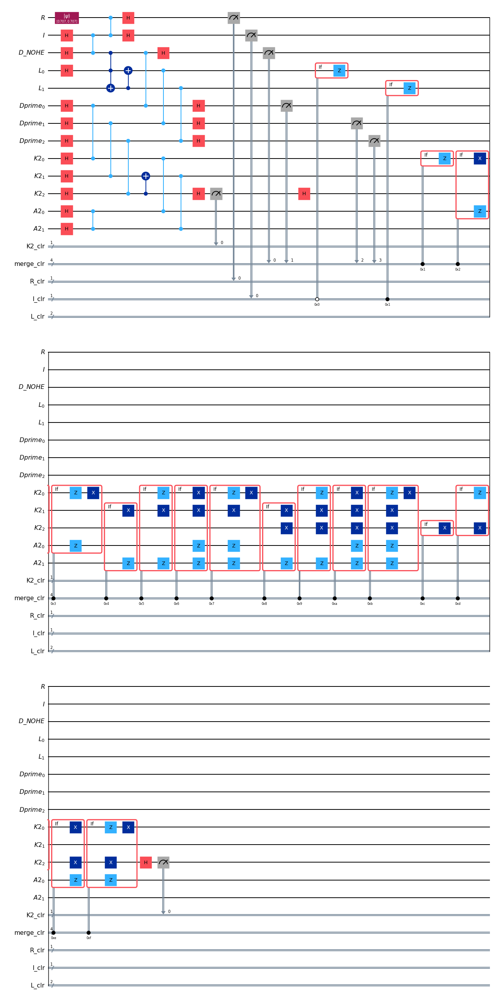

In [25]:
# TESTING ON MERGED PHI's (v1) - This test only works when you do not entangle L with D'. But, I'm not sure whether it actually tests the merging in that case.
n = 1
N = 2**n

mem_bits = qry.make_mem_bits(n)
qc_addr = qry.initialize_adresses(n, register_name="R")
qc_RS = rsp.make_phi_normal(n)
qc = qc_RS.tensor(qc_addr)

qry.query_step_i(qc, n)

L = grl.get_qreg(qc, "L")
I_clr = grl.get_creg(qc, "I_clr")

qry.query_step_ii(qc, L, I_clr, mem_bits)

print(f"mem bits: {mem_bits}")
grl.print_qubit_table(qc)
qc.draw("mpl", scale=0.7)

In [26]:
shots = 1
sim = AerSimulator(method='matrix_product_state',
                   matrix_product_state_truncation_threshold=1e-12,
                   matrix_product_state_max_bond_dimension=1024)

job = sim.run(qc, shots=shots, memory=True)
res = job.result()
print("Overall success:", res.success)
print("Overall status:", res.to_dict().get("status", ""))

Overall success: True
Overall status: COMPLETED


mem bits: [1, 0, 0, 0]
b = 00
L_0 = 1
L_1 = 0
L_2 = 0
L_3 = 0
L_meas = 0001


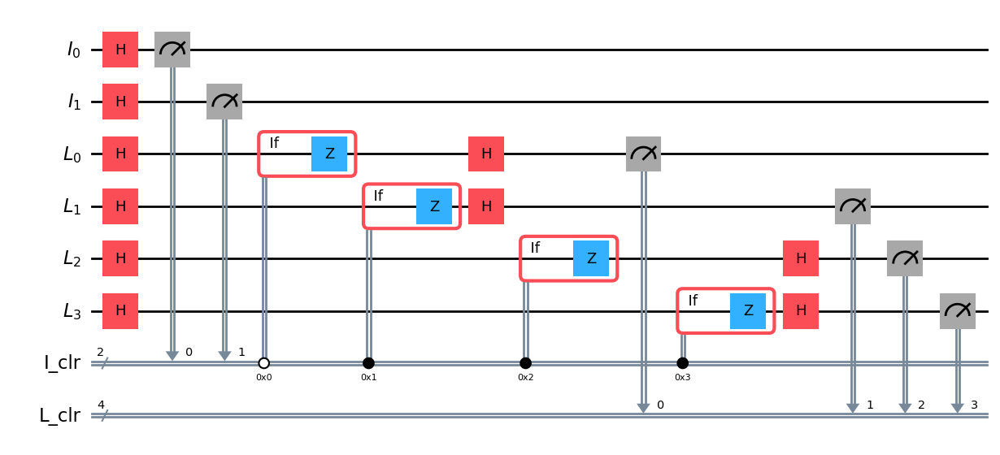

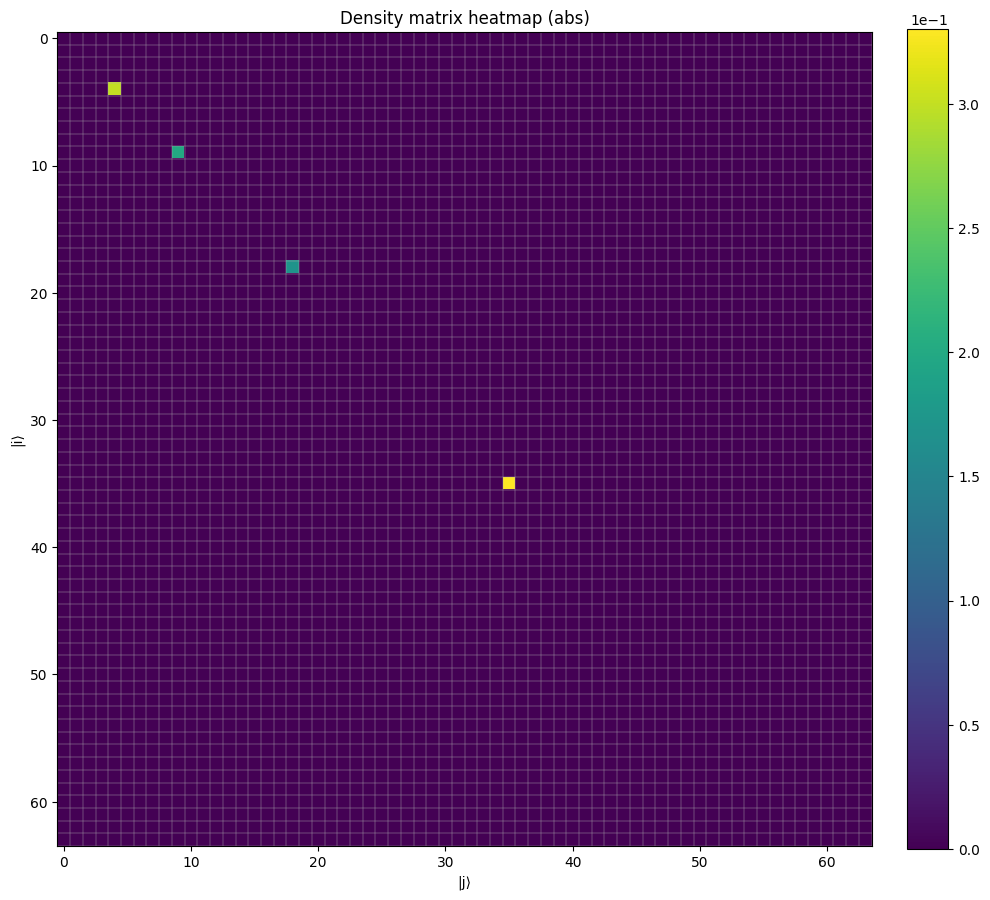

In [27]:
# TESTING ON SIMPLE CIRCUIT
# Define sizes
shots=100
n = 2
N = 2 ** n
mem_bits = [0]*N
mem_bits[0] = 1
# mem_bits[1] = 1
# mem_bits[2] = 1
# mem_bits[3] = 1
print(f"mem bits: {mem_bits}")

# Build registers
I = QuantumRegister(n, "I")
L = QuantumRegister(N, "L")
I_clr = ClassicalRegister(n, "I_clr")
L_clr = ClassicalRegister(N, "L_clr")
qc = QuantumCircuit(I, L, I_clr, L_clr)

# (Your circuit goes here...)
qc.h(I[0])
qc.h(I[1])
qc.h(L)
qc.measure(I, I_clr)

# Apply the logic
qry.query_step_ii(qc, L, I_clr, mem_bits)

qc.h(L)
qc.measure(L, L_clr)

# Simulate and get results
sim = AerSimulator(method='statevector')#,
                   # matrix_product_state_truncation_threshold=1e-12,
                   # matrix_product_state_max_bond_dimension=256)
res = sim.run(qc, shots=shots, memory=True).result()
mem = res.get_memory(0)[0]       # e.g. '... 101 00'
counts = res.get_counts()

rho = grl.counts_to_dm(counts, n=len(qc.qubits))
# keep = list(range(n+n+2*N-1)) 
# rho_partial = grl.reduced_dm(rho, keep_qubits=keep)
grl.plot_dm_heatmap(rho, which="abs", max_dim=1e5)  # adjust cap if you have RAM

b = mem[-n:]
L_meas = mem[:N]

print(f"b = {b}")
for i in range(N):
    print(f"L_{i} = {L_meas[-i-1]}")
print(f"L_meas = {L_meas}")
# (Optionally) inspect / transpile / run qc on backend/simulator
qc.draw("mpl")


In [28]:
# TESTING WITH PHI 1 ONLY
n = 1
N = 2**n
shots = 100

# make mem_bits:
mem_bits = [0]*N
mem_bits[0] = 1
# mem_bits[1] = 1
print(f"mem bits: {mem_bits}")

# prepare address and phi 1
addr = 0
vec = np.zeros([N])
vec[addr] = 1
qc_addr = qry.initialize_adresses(n, register_name="R", method="Supply vector", vec=vec)
qc_phi1 = rsp.make_Phi1(n)
qc = qc_phi1.tensor(qc_addr)

# measure D_NOHE
D_NOHE = grl.get_qreg(qc, "D_NOHE")
D_NOHE_clr = ClassicalRegister(N-1, "D_NOHE_clr")
qc.add_register(D_NOHE_clr)
qc.measure(D_NOHE[:], D_NOHE_clr[:])

# do step i (i.e. BMs between R and I)
qry.query_step_i(qc, n)

# do step ii (i.e. data loading on L, given I_clr outcomes and mem_bits)
L = grl.get_qreg(qc, "L")
I_clr = grl.get_creg(qc, "I_clr")
qry.query_step_ii(qc, L, I_clr, mem_bits)


# rotate pointer in OHE to -1 in Z basis
for b in range(N):
    p = addr ^ b
    with qc.if_test((I_clr, b)):
        if mem_bits[addr] == 0:
            qc.z(L[p])
        qc.h(L[p])


# measure OHE part (L)
L_clr = ClassicalRegister(N, "L_clr")
qc.measure(L[:], L_clr[:])

# simulate
sim = AerSimulator(
    method="matrix_product_state",
    # matrix_product_state_max_bond_dimension=1024,         # cap growth
    # matrix_product_state_truncation_threshold=1e-10          # (optional) internal parallelism
)
tqc = transpile(qc, backend=sim, optimization_level=0)
res = sim.run(tqc, shots=shots, memory=True).result()
print("Success:", res.success)
print("Overall status:", res.to_dict().get("status", ""))
mem = res.get_memory()
# for m in mem:
#     print(m)

d = {"00 0": 0, "00 1": 0, "01 0": 0, "10 0":0, "01 1": 0, "10 1":0, "11 0":0, "11 1":0}
for m in mem:
    if m[:4] == "00 0":
        d["00 0"] += 1
    elif m[:4] == "00 1":
        d["00 1"] += 1
    elif m[:4] == "01 0":
        d["01 0"] += 1
    elif m[:4] == "10 0":
        d["10 0"] += 1
    elif m[:4] == "01 1":
        d["01 1"] += 1
    elif m[:4] == "10 1":
        d["10 1"] += 1
    elif m[:4] == "11 0":
        d["11 0"] += 1
    elif m[:4] == "11 1":
        d["11 1"] += 1
for key, value in d.items():
    print(key, ":", value)

grl.print_qubit_table(qc)

mem bits: [1, 0]
Success: True
Overall status: COMPLETED
00 0 : 0
00 1 : 0
01 0 : 56
10 0 : 0
01 1 : 0
10 1 : 44
11 0 : 0
11 1 : 0
qubit                                    global  register  reg_idx
------------------------------------------------------------------
<Qubit register=(1, "R"), index=0>            0  R               0
<Qubit register=(1, "I"), index=0>            1  I               0
<Qubit register=(1, "D_NOHE"), index=0>       2  D_NOHE          0
<Qubit register=(2, "L"), index=0>            3  L               0
<Qubit register=(2, "L"), index=1>            4  L               1

clbit                                        global  register    reg_idx
------------------------------------------------------------------------
<Clbit register=(1, "D_NOHE_clr"), index=0>       0  D_NOHE_clr        0
<Clbit register=(1, "R_clr"), index=0>            1  R_clr             0
<Clbit register=(1, "I_clr"), index=0>            2  I_clr             0
<Clbit register=(2, "L_clr"), inde

#### Query step iii

In [4]:
n = 1
N = 2**n
save_svs = False

mem_bits = [0] * N
mem_bits[0] = 1
# mem_bits[1] = 1
# mem_bits[2] = 1
# mem_bits[3] = 1
addr = 0
vec = np.zeros([N])
vec[addr] = 1
qc_addr = qry.initialize_adresses(n, register_name="R", method="Supply vector", vec=vec)
qc_RS = rsp.make_phi_normal(n, save_svs=save_svs)
qc = qc_RS.tensor(qc_addr)
qc.metadata = qc_RS.metadata | qc_addr.metadata

qry.query_step_i(qc, n, save_svs=save_svs)

L = grl.get_qreg(qc, "L")
I_clr = grl.get_creg(qc, "I_clr")

qry.query_step_ii(qc, L, I_clr, mem_bits, save_svs=save_svs)

qry.query_step_iii(qc, n, save_svs=save_svs)

output_clr = ClassicalRegister(n+1, "output_clr")
qc.add_register(output_clr)
K2 = grl.get_qreg(qc, "K2")
qc.measure(K2[:n+1], output_clr[:])


# grl.print_qubit_table(qc)
# qc.draw("mpl", scale=0.7)

In [5]:
mem, counts = grl.simulate_circuit(qc, shots=20, method="matrix_product_state", print_mem=True)

Success: True
Overall status: COMPLETED
Elapsed time is 0.050067277749379475 min
10 01 11 0 1 0001 1
10 00 11 0 0 1100 1
10 01 00 0 0 1111 1
10 11 10 1 0 0100 1
10 11 11 1 1 0011 1
10 01 10 1 0 1111 0
10 11 11 0 1 1100 1
10 10 11 1 0 0010 1
10 10 11 0 0 0111 0
10 00 00 0 1 0001 0
10 11 01 1 0 1011 1
10 01 01 1 1 0001 0
10 11 11 1 0 0011 0
10 01 11 0 1 0111 0
10 01 11 1 0 1010 1
10 10 01 1 1 1101 1
10 00 01 0 0 0110 0
10 11 01 1 0 0101 1
10 11 01 1 0 1000 0
10 11 01 1 1 1001 1


#### Full QRAM query

In [3]:
# input variables
n = 2
N = 2**n
save_svs = False

# prepare mem bits
mem_bits = [0] * N
mem_bits[0] = 1
# mem_bits[1] = 1
# mem_bits[2] = 1
# mem_bits[3] = 1

# prepare addr and RS
addr_vec = np.zeros(N, int); addr = 0; addr_vec[addr] = 1 
qc_addr = qry.initialize_adresses(n, register_name="R", method="Supply vector", vec=addr_vec)
qc_RS   = rsp.make_phi_normal(n, save_svs=save_svs)

# run query
qc = qry.QRAM_query(qc_addr, qc_RS, n, mem_bits, save_svs=False, meas_output=True)

In [4]:
mem, counts = grl.simulate_circuit(qc, shots=20, method="matrix_product_state", print_mem=True)

Success: True
Overall status: COMPLETED
Elapsed time is 1.6073832750320434 min
100 01 11 1010 1000 00 01 0010010101 1111
100 00 00 0101 1011 11 10 0100000010 0100
100 01 00 1001 0111 01 00 0010100010 0001
100 00 00 0101 1010 10 10 1110000110 1010
100 01 01 1010 1011 00 10 1101000110 0001
100 11 00 0101 0010 11 01 1001010010 0110
100 11 10 0111 0011 01 10 1111000100 0001
100 10 10 1100 1010 01 10 1011010000 1101
100 10 01 0001 0100 11 01 1011000100 1010
100 01 11 0001 0010 00 10 0000110011 0111
100 11 01 0110 1011 10 01 1101110100 1000
100 00 11 1010 0111 10 00 0011000110 0101
100 01 01 1100 0000 10 11 0010011000 0000
100 01 01 1001 1011 00 01 1000110010 0111
100 10 01 1001 1100 01 10 0010101101 1111
100 10 01 0011 0101 01 00 1011010010 1100
100 10 00 1011 1110 10 11 0011010010 0011
100 10 11 1011 0101 10 01 0101111010 1100
100 11 00 1001 0011 01 01 1011000011 0110
100 10 01 1000 0110 01 10 0001100110 1001
